# Quick Start Guide to Sentinel Hub APIs

In this notebook we will run through examples of the different APIs that you can access through Sentinel Hub.

We will have a look at:

- Process API
- Statistical API
- Batch Processing API
- Statistical Batch Processing API

In this notebook, we will also be taking a look at Evalscripts that are an important part of making any request you make to Sentinel Hub.



## Use Case Example: Deforestation in the Mato Grosso Region

In this Jupyter Notebook we are going to investigate deforestation events happening in the state of Mato Grosso in western Brazil.



![Deforestation](https://api.time.com/wp-content/uploads/2021/04/Amazon-Deforestation.jpg?w=800&quality=85)

Deforested areas in the rainforest, Brazil, on August 24, 2019. Carlos Fabal – AFP/Getty Images

### Load necessary libraries

Firstly, we need to import several libraries so that we can run through the examples we have prepared.

In [1]:
# Sentinel Hub Py
from sentinelhub import (SHConfig, BBox, bbox_to_dimensions, SentinelHubRequest,
                         SentinelHubStatistical, SentinelHubBatch, DataCollection, 
                         MimeType, Geometry, BatchSplitter, monitor_batch_job)

# Utilities
from oauthlib.oauth2 import BackendApplicationClient
from requests_oauthlib import OAuth2Session
import pandas as pd
import numpy as np
import boto3
import time
import json

# Geographical libraries
import geopandas as gpd

# Plotting
import IPython
import matplotlib.pyplot as plt

# Rasterio
import rasterio as rio
from rasterio.plot import show

### Setup environment variables

There are several options to set up your Sentinel Hub credentials, depending on how you want to access the services. In this workflow, as we will be working with the `sentinelhub-py` package to run requests in Python, we set up an `SHConfig` object that will take care of identification with the services for us.

In [2]:
# Load credentials
from credentials import *

In [3]:
# Setup SH services access
config = SHConfig()
config.sh_client_id = SH_CLIENT_ID
config.sh_client_secret = SH_CLIENT_SECRET

---

## Process API

Now that the credentials are set up, it is possible to request satellite images.

We will start by plotting an overview True Color RBG image from Sentinel-2 of the area that we will be working on.

The *Sentinel Hub Process API* will need the following information for a valid request:

+ An **AOI** (area of interest): that contains the location's coordinates (polygon or bounding box). The image size is pre-calculated according to the resolution desired.
+ **Evalscript** in which you specify the data products and their visualisation
+ **Request body** with parameters about the location and time

### Define coordinates for area of interest and create a bbox object
<img src="./media/Map.jpeg" width="500">

In [4]:
# Read GeoJSON
gdf = gpd.read_file("./input_data/deforestation_specific_aoi.geojson")
crs = gdf.crs.to_epsg()
bbox = list(gdf.total_bounds)

# Set AOI overview bbox
resolution = 10
aoi_overview = BBox(bbox=bbox, crs=crs)  # Make a BBox object of the list of coordinates
aoi_overview_size = bbox_to_dimensions(aoi_overview, resolution=resolution)  # Automatically calculate the output size in px

print(f"Output image size: {aoi_overview_size[0]} * {aoi_overview_size[1]} px")

Output image size: 1892 * 1833 px


### Evalscript creation

An [Evalscript](https://docs.sentinel-hub.com/api/latest/evalscript/v3/) is a piece of Javascript code that allows you to define the input and output parameters of the data you would like to query, as well as specifying the processing to be applied to the satellite images.

For the evalscript you must specify at least the two following functions:

+ setup function: this sets up the input (i.e. which bands to call) and output settings (number of bands to return, format, etc...).
+ evaluatePixel function - this function is where you specify the processing (to derive new information from the images, or for visualisation) to be applied to the images.

In the following Evalscript, we want to return an RGB True Color image. In the `setup` function, we will specify that we want to use the Red (`B04`), Green (`B03`) and Blue (`B02`) bands of Sentinel-2. Since we want a three-channel image (RGB), we specify that our output will have three bands. We use the convenient `AUTO` sample type for the returned data, as we are just going to visualise it. With `AUTO` values should range from 0-1, which will then automatically be stretched from the interval [0, 1] to [0, 255] and written into a UINT8 raster.

Because the image would be too dark if we return directly the band values scaled from 0 to 255, we apply a gain (multiplying the values by 3.5). This is just for visualisation purposes.

In [5]:
evalscript_true_color = """
//VERSION=3

// Set up the input and output settings

function setup() {
  return {
    input: ["B02", "B03", "B04"],  //define input bands
    output: { bands: 3, sampleType: SampleType.AUTO}  //define amount of channels in output image (RGB = 3)
  };
}

// Map the input bands to the values in the output raster

function evaluatePixel(sample) {
  let gain = 5;
  return [gain * sample.B04, gain * sample.B03, gain * sample.B02];    //map bands 4, 3, 2 to RGB channels and multiply by 5 for enhanced truecolor visualisation
}
"""

### Request body creation

The run the Evalscript, we need to define the payload, or data parameters to send to Sentinel Hub Services. The Sentinel Hub python package simplifies the writing of the payload, by using the `SentinelHubRequest` class to pass the following input parameters:

1. the created evalscript
2. input data (data source and time interval)
3. define the output (name and format)
4. define bbox
5. size of the requested image
6. identification with the SHConfig object


In [6]:
request = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2017-06-09", "2017-06-09")
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF
        )
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

Now that the request is created, we just need to run it using the `get_data` method.

In [7]:
overview = request.get_data()

### Plot the requested image

By using `get_data` without any additional parameters saved the results to the `overview` variable. Let's plot it to look at the returned data.

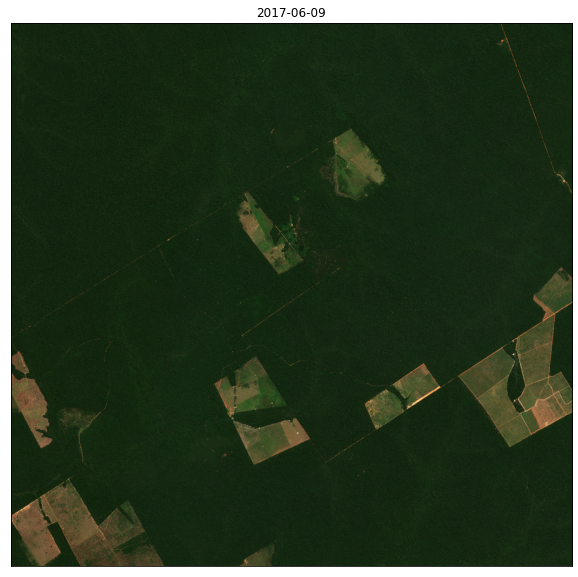

In [8]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,10))
ax.imshow(overview[0])

# Plot configuration
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("2017-06-09")

plt.show()

### Quiz: can you figure out how to request a falsecolor infrared image?
Try to fill in the gaps in the evalscript below.

*Hint: To receive a falsecolor infrared image you need to map Sentinel-2 Band 8 is NIR, Band 4 is red, and Band 3 is green*.

In [9]:
evalscript_false_color = """
//VERSION=3

function setup() {
  return {
    input: ["", "", ""],
    output: { bands: 3 }
  };
}

function evaluatePixel(sample) {
  let gain = 2.5;
  return [ , , ];
}
"""

Uncomment the following cell for the solution. Make sure to run the following cell twice, one time for fetching the solution and a second time for running the Evalscript.


In [12]:
# %load https://raw.githubusercontent.com/sentinel-hub/code-snippets/master/phiweek2020/Solution.py

Now that we have the Evalscript, let's run the request:

In [13]:
false_color_request = SentinelHubRequest(
    evalscript=evalscript_false_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2017-06-09", "2017-06-09")
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF)
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

overview_fc = false_color_request.get_data()

### Plot the False Color image 

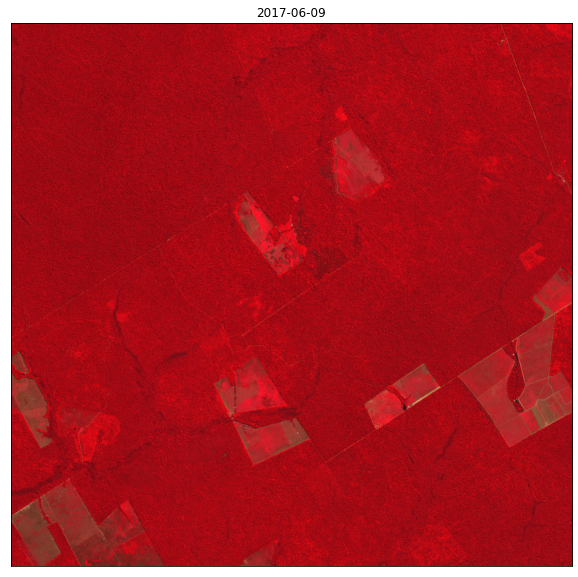

In [14]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,10))
ax.imshow(overview_fc[0])

# Plot configuration
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("2017-06-09")

plt.show()

### Let's take a look at the same area in 2021

In [15]:
# Request the true color image in 2021
true_color_request_2021 = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2021-06-08", "2021-06-08")
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF)
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

overview_tc_2021 = true_color_request_2021.get_data()

# Request the false color image in 2021
false_color_request_2021 = SentinelHubRequest(
    evalscript=evalscript_false_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2021-06-08", "2021-06-08")
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF)
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

overview_fc_2021 = false_color_request_2021.get_data()

### Plotting the True Color and False Color visualisations of the AOI from 2017 & 2021

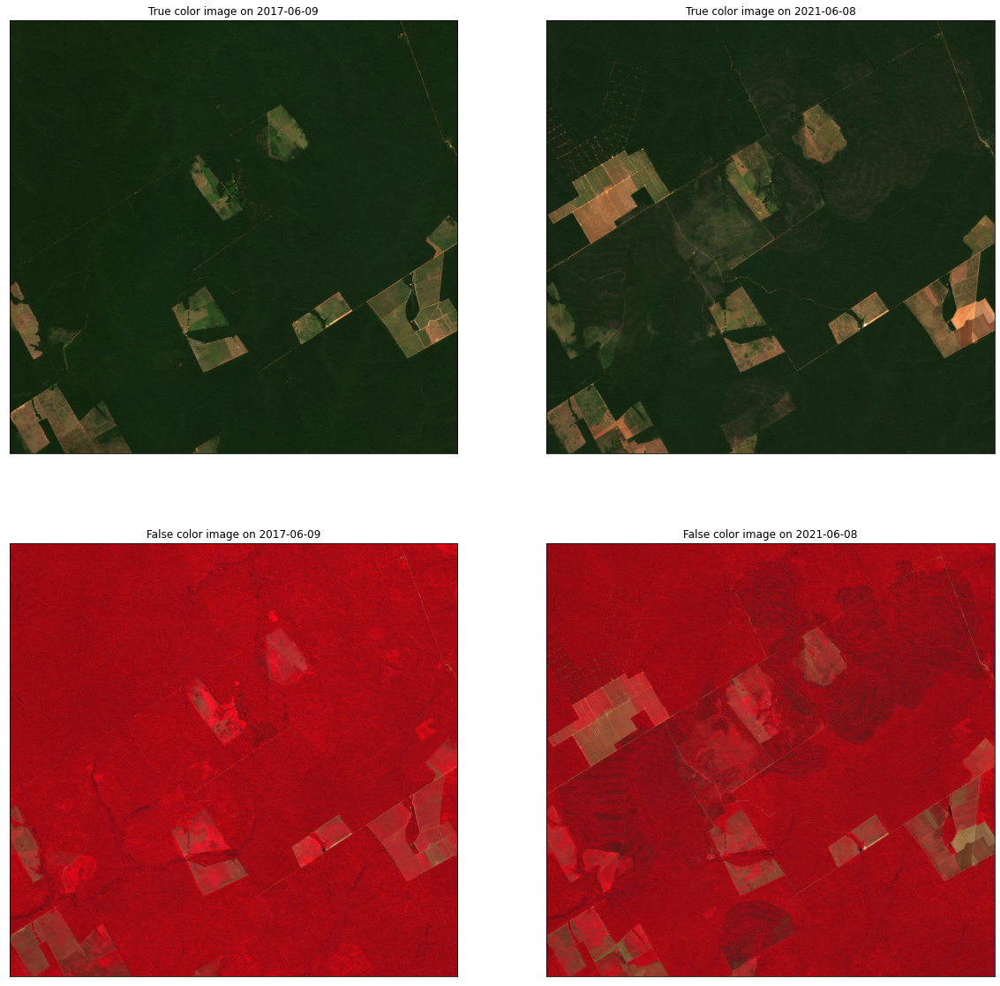

In [16]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))

show(np.moveaxis(overview[0], -1, 0), ax=axs[0, 0])
show(np.moveaxis(overview_tc_2021[0], -1, 0), ax=axs[0, 1])
show(np.moveaxis(overview_fc[0], -1, 0), ax=axs[1, 0])
show(np.moveaxis(overview_fc_2021[0], -1, 0), ax=axs[1,1])

# Plot configuration
for y in axs:
    for x in y:
        x.set_xticks([])
        x.set_yticks([])

axs[0, 0].set_title("True color image on 2017-06-09")
axs[0, 1].set_title("True color image on 2021-06-08")
axs[1, 0].set_title("False color image on 2017-06-09")
axs[1, 1].set_title("False color image on 2021-06-08")

plt.show()

---

## Statistical API

- Request statistics of NDVI within degraded area (No need to download pixels)
- Request time-series of NDVI

![degraded area](./media/degraded_area.png)

In [17]:
# Read GeoJson
degraded_area_crs = "EPSG:32721"
degraded_gdf = gpd.read_file("./input_data/area_of_change.geojson").set_crs(degraded_area_crs, allow_override=True)

# Set geometry
degraded_geom = Geometry(degraded_gdf.geometry.iloc[0], crs=degraded_area_crs)

In [18]:
evalscript_ndvi = """
//VERSION=3
  function setup() {
    return {
      input: [{
        bands: [
          "B04",
          "B08",
          "CLM",
          "dataMask"
        ]
      }],
      output: [
        {
          id: "NDVI",
          bands: 1
        },
        {
          id: "dataMask",
          bands: 1
        }
      ],
      mosaicking: "SIMPLE"
    };
  }

  function evaluatePixel(samples) {
      let ndvi = (samples.B08 - samples.B04) / (samples.B08 + samples.B04);

      let ndviMask = 1;
      let noCloudMask = 1;
      if (!isFinite(ndvi)) {
        ndviMask = 0;
      }
      if (samples.CLM === 1) {
        noCloudMask = 0;
      }

      return {
          NDVI: [ndvi],
          dataMask: [
            samples.dataMask * ndviMask * noCloudMask
          ]
      };
  }
  """

In [19]:
ndvi_request = SentinelHubStatistical(
    aggregation=SentinelHubStatistical.aggregation(
        evalscript=evalscript_ndvi,
        time_interval=('2017-07-01', '2021-07-01'),
        aggregation_interval='P30D',
        resolution=(10, 10),
        other_args={
            'aggregationInterval': {
                'lastIntervalBehavior': 'EXTEND'
            }
        }
    ),
    input_data=[
        SentinelHubStatistical.input_data(
            DataCollection.SENTINEL2_L2A,
        )
    ],
    geometry=degraded_geom,
    config=config
)

In [20]:
ndvi_stats = ndvi_request.get_data()

In [21]:
# define functions to extract statistics for all acquisition dates
def extract_stats(date, stat_data):
    d = {}
    for key, value in stat_data['outputs'].items():
        stats = value['bands']['B0']['stats']
        if stats['sampleCount']==stats['noDataCount']:
            continue
        else:
            d['date'] = [date]
            for stat_name, stat_value in stats.items():
                if (stat_name=='sampleCount' or stat_name=='noDataCount'):
                    continue
                else:
                    d[f'{key}_{stat_name}'] = [stat_value]
    return pd.DataFrame(d)

def read_acquisitions_stats(stat_data):
    df_li = []
    for aq in stat_data:
        date = aq['interval']['from'][:10]
        df_li.append(extract_stats(date, aq))
    return pd.concat(df_li)

In [22]:
result_df = read_acquisitions_stats(ndvi_stats[0]['data'])
result_df

,date,NDVI_min,NDVI_max,NDVI_mean,NDVI_stDev
0,2017-07-01,0.374458,0.942393,0.883379,0.024337
0,2017-07-31,0.388260,0.904247,0.855779,0.023516
0,2017-08-30,0.339443,0.853022,0.786187,0.024251
0,2017-09-29,0.330408,0.967241,0.789998,0.069004
0,2017-12-28,0.114084,0.903036,0.800177,0.117525
0,2018-04-27,0.215863,0.926450,0.862847,0.038001
0,2018-05-27,0.271078,0.951993,0.883633,0.040674
0,2018-06-26,0.154381,0.935152,0.873929,0.055352
0,2018-07-26,0.152983,0.911089,0.846414,0.068331
0,2018-09-24,0.162594,0.862069,0.749944,0.068382


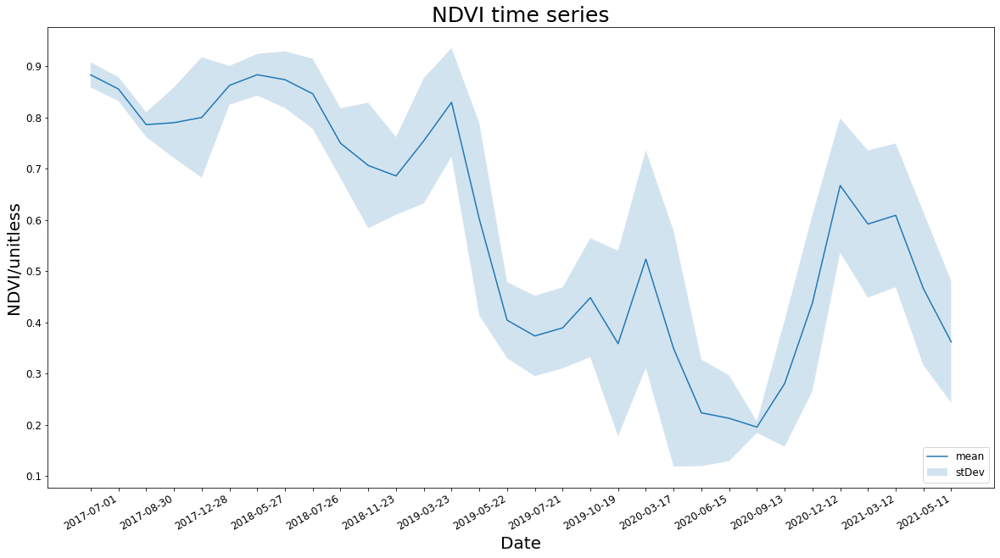

In [23]:
fig_stat, ax_stat =  plt.subplots(1, 1, figsize=(20,10))
t = result_df['date']
ndvi_mean = result_df['NDVI_mean']
# ndvi_min = result_df['NDVI_min']
# ndvi_max = result_df['NDVI_max']
ndvi_std = result_df['NDVI_stDev']
ax_stat.plot(t, ndvi_mean, label='mean')
# ax_stat.plot(t, ndvi_min, label='min')
# ax_stat.plot(t, ndvi_max, label='max')
ax_stat.fill_between(t, ndvi_mean - ndvi_std, ndvi_mean + ndvi_std, alpha=0.2, label='stDev')
ax_stat.tick_params(axis='x', labelrotation=30, labelsize=12)
ax_stat.tick_params(axis='y', labelsize=12)
ax_stat.set_xlabel('Date', size=20)
ax_stat.set_ylabel('NDVI/unitless', size=20)
ax_stat.legend(loc='lower right', prop={'size': 12})
ax_stat.set_title('NDVI time series', fontsize=25)
for label in ax_stat.get_xticklabels()[1::2]:
    label.set_visible(False)

### What happened at the end of April 2019?

In [24]:
# Request the true color image in July 2020
true_color_request_202007 = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2019-04-20", "2019-04-30"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC","maxCloudCoverage": 100}}
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF)
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

overview_tc_202007 = true_color_request_202007.get_data()

# Request the false color image in July 2020
false_color_request_202007 = SentinelHubRequest(
    evalscript=evalscript_false_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2019-04-20", "2019-04-30"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC","maxCloudCoverage": 100}}
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF)
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

overview_fc_202007 = false_color_request_202007.get_data()

# Request the true color image in September 2020
true_color_request_202009 = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2019-05-20", "2019-05-30"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC","maxCloudCoverage": 100}}            
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF)
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

overview_tc_202009 = true_color_request_202009.get_data()

# Request the false color image in September 2020
false_color_request_202009 = SentinelHubRequest(
    evalscript=evalscript_false_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2019-05-20", "2019-05-30"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC","maxCloudCoverage": 100}}
        )
    ],
    responses=[
        SentinelHubRequest.output_response(
            'default', MimeType.TIFF)
    ],
    bbox=aoi_overview,  
    size=aoi_overview_size,
    config=config
)

overview_fc_202009 = false_color_request_202009.get_data()

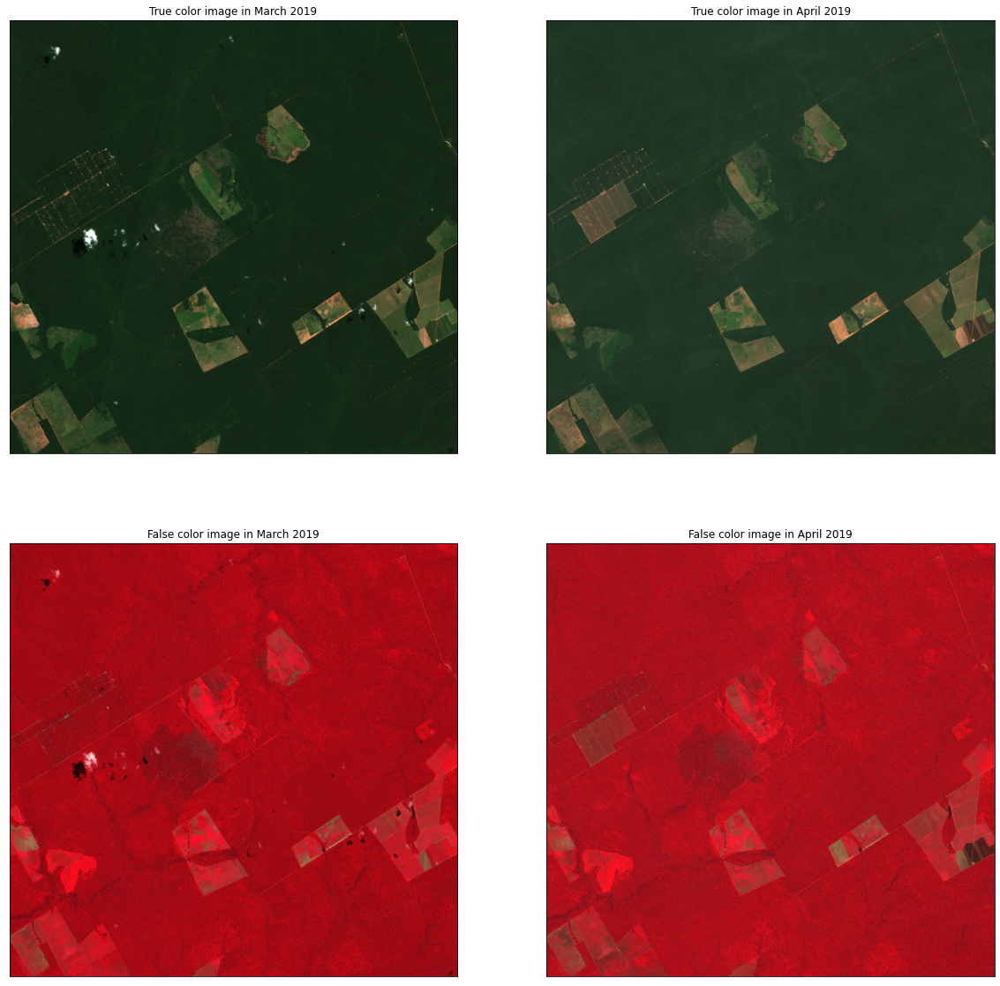

In [25]:
fig_2020, axs_2020 = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))

show(np.moveaxis(overview_tc_202007[0], -1, 0), ax=axs_2020[0, 0])
show(np.moveaxis(overview_tc_202009[0], -1, 0), ax=axs_2020[0, 1])
show(np.moveaxis(overview_fc_202007[0], -1, 0), ax=axs_2020[1, 0])
show(np.moveaxis(overview_fc_202009[0], -1, 0), ax=axs_2020[1, 1])

# Plot configuration
for y in axs_2020:
    for x in y:
        x.set_xticks([])
        x.set_yticks([])

axs_2020[0, 0].set_title("True color image in March 2019")
axs_2020[0, 1].set_title("True color image in April 2019")
axs_2020[1, 0].set_title("False color image in March 2019")
axs_2020[1, 1].set_title("False color image in April 2019")

plt.show()

We can clearly see that a large plot of forest has been cut down in the area of interest.

## Batch Processing API

Batch Processing API (or shortly "batch API") enables you to request data for large areas and/or longer time periods. It is an asynchronous REST service. This means that data will not be returned immediately in a request response but will be delivered to your object storage, in this case, we are using Amazon Web Services.

- Process over a large area
- Cloudless mosaic

### Let's request a cloudless mosaic over a larger area nearby

In [26]:
# Read GeoJSON
nearby_area = gpd.read_file("./input_data/nearby_area.geojson", crs=degraded_area_crs)

geom_degraded_nearby_area = Geometry(
    nearby_area.geometry.iloc[0], 
    crs=degraded_area_crs
)

### Set AWS credentials

As we are writing data to AWS S3 storage, we need to define our credentials to do this.

In [27]:
config.aws_access_key_id = AWS_ACCESS_KEY_ID
config.aws_secret_access_key = AWS_SECRET_ACCESS_KEY

### Define a batch client

In [28]:
batch = SentinelHubBatch(config=config)

### Select a tiling grid

For more effective processing we divide the area of interest into tiles and process each tile separately. While process API uses grids which come together with each datasource for processing of the data, the batch API uses one of the predefined tiling grids.

In [29]:
# Provided tiling grid
list(batch.iter_tiling_grids())

[{'id': 0,
  'name': '20km grid',
  'properties': {'tileWidth': 20040.0,
   'tileHeight': 20040.0,
   'chunkWidth': 334,
   'chunkHeight': 167,
   'resolutions': [10.0, 20.0, 60.0],
   'unit': 'METRE'}},
 {'id': 1,
  'name': '10km grid',
  'properties': {'tileWidth': 10000.0,
   'tileHeight': 10000.0,
   'chunkWidth': 500,
   'chunkHeight': 500,
   'resolutions': [10.0, 20.0, 1.4999],
   'unit': 'METRE'}},
 {'id': 2,
  'name': '100km grid',
  'properties': {'tileWidth': 100080.0,
   'tileHeight': 100080.0,
   'chunkWidth': 278,
   'chunkHeight': 278,
   'resolutions': [360.0, 60.0, 120.0, 240.0],
   'unit': 'METRE'}},
 {'id': 3,
  'name': 'WGS84 1 degree grid',
  'properties': {'tileWidth': 1.0,
   'tileHeight': 1.0,
   'chunkWidth': 500,
   'chunkHeight': 500,
   'resolutions': [0.0001, 0.0002],
   'unit': 'DEGREE'}},
 {'id': 4,
  'name': 'WGS84 0.25 degree grid',
  'properties': {'tileWidth': 0.25,
   'tileHeight': 0.25,
   'chunkWidth': 0,
   'chunkHeight': 0,
   'resolutions': [0.0

In [30]:
# Specify grid ID here:
GRID_ID = 1

batch.get_tiling_grid(GRID_ID)

{'id': 1,
 'name': '10km grid',
 'properties': {'tileWidth': 10000.0,
  'tileHeight': 10000.0,
  'chunkWidth': 500,
  'chunkHeight': 500,
  'resolutions': [10.0, 20.0, 1.4999],
  'unit': 'METRE'}}

### Set up an S3 bucket

In [31]:
# Write bucket name here:
BUCKET_NAME = 'dlr-demo'

### Evalscript

In [32]:
evalscript_batch = """
//VERSION=3

function setup() {
  return {
    input: ["B02", "B03", "B04", "B08"],
    output: [
      {
        "id": "true_color",
        "bands": 3
      },
      {
        "id": "false_color",
        "bands": 3
      }
    ]
  };
}

function evaluatePixel(sample) {
  const true_color_gain = 3.5;
  const false_color_gain = 2.5;
  return {
    "true_color": [true_color_gain * sample.B04, true_color_gain * sample.B03, true_color_gain * sample.B02],
    "false_color": [false_color_gain * sample.B08, false_color_gain * sample.B04, false_color_gain * sample.B03]
  };
}
"""


### Join batch request definition

In [33]:
cloudless_mosaic_request = SentinelHubRequest(
    evalscript=evalscript_batch,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2021-06-01", "2021-09-01"),
            mosaicking_order='leastCC'
        )
    ],
    responses=[
        SentinelHubRequest.output_response('true_color', MimeType.TIFF),
        SentinelHubRequest.output_response('false_color', MimeType.TIFF)
    ],
    geometry=geom_degraded_nearby_area,
    # This time we don't specify size parameter
    config=config
)

batch_request = batch.create(
    cloudless_mosaic_request,
    tiling_grid=SentinelHubBatch.tiling_grid(
        grid_id=GRID_ID,
        resolution=10
    ),
    bucket_name=BUCKET_NAME,
    # Check documentation for more about output configuration options:
    # output=SentinelHubBatch.output(...)
    description='least cloudy imagery'
)

batch_request

BatchRequest(
  request_id=da0cd7a7-31e0-411c-bd73-06d5905d96a3
  description=least cloudy imagery
  bucket_name=dlr-demo
  created=2022-02-16 23:40:59.666008+00:00
  status=BatchRequestStatus.CREATED
  user_action=BatchUserAction.NONE
  tile_count=56
  ...
)

### Request detailed analysis (ANALYSE)

In [34]:
batch.start_analysis(batch_request)

''

In [37]:
batch_request = batch.get_request(batch_request)

batch_request

BatchRequest(
  request_id=da0cd7a7-31e0-411c-bd73-06d5905d96a3
  description=least cloudy imagery
  bucket_name=dlr-demo
  created=2022-02-16 23:40:59.666008+00:00
  status=BatchRequestStatus.ANALYSIS_DONE
  user_action=BatchUserAction.ANALYSE
  value_estimate=284.8307376552839
  tile_count=56
  ...
)

**Note:** At this point you can run the **Update and show batch request status** cell again to check the status of the request.

### Visual tracking of the Batch request
- The following cells allow us to track the progress of the Batch request by plotting the status of the tiles. To visually track the progress of the Batch request, we can keep executing the Plotting command.

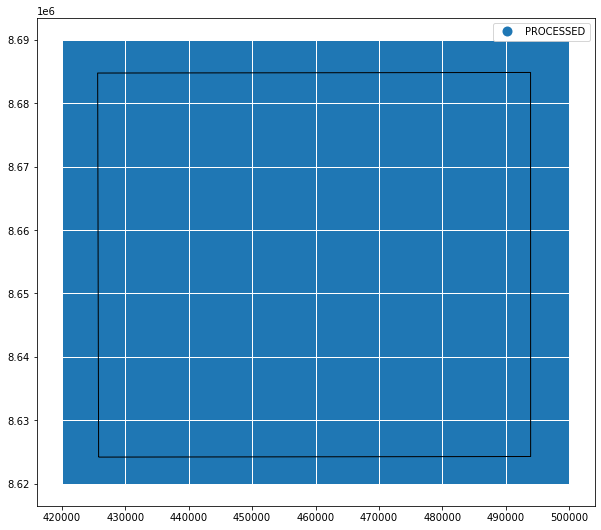

In [48]:
splitter = BatchSplitter(batch_request=batch_request, config=config)

def plot_batch_splitter(splitter):
    """ Plots tiles and area geometry from a splitter class
    """
    tile_geometries = [Geometry(bbox.geometry, bbox.crs) for bbox in splitter.get_bbox_list()]
    tile_geometries = [geometry.transform(splitter.crs) for geometry in tile_geometries]

    gdf = gpd.GeoDataFrame(
        {'status': [info['status'] for info in splitter.get_info_list()]},
        geometry=[geometry.geometry for geometry in tile_geometries],
        crs=splitter.crs.pyproj_crs()
    )
    ax = gdf.plot(column='status', legend=True, figsize=(10, 10), edgecolor="w")

    area_series = gpd.GeoSeries(
        [splitter.get_area_shape()],
        crs=splitter.crs.pyproj_crs()
    )
    area_series.plot(ax=ax, facecolor='none', edgecolor='black')


plot_batch_splitter(splitter)


### Request the start of processing (START)

In [39]:
batch.start_job(batch_request)

''

## Helper Functions to fetch and plot the data from AWS S3

In [49]:
def create_s3_resource(aws_access_key_id, aws_secret_access_key):
    return boto3.resource(
        's3',
        aws_access_key_id=aws_access_key_id,
        aws_secret_access_key=aws_secret_access_key
    )

def get_result_file_list(s3_resource, aws_bucket, path_to_folder):
    s3_bucket = s3_resource.Bucket(aws_bucket)
    obj_list = []
    for obj in s3_bucket.objects.filter(Prefix=path_to_folder):
        obj_list.append(obj.key)
    return obj_list

def create_s3_session(aws_access_key_id, aws_secret_access_key):
    return boto3.Session(
        aws_access_key_id=aws_access_key_id,
        aws_secret_access_key=aws_secret_access_key,
    )

def read_tif(s3_session, bucket_name, obj_path):
    with rio.Env(rio.session.AWSSession(s3_session)):
        with rio.open(f"s3://{bucket_name}/{obj_path}") as src:
            data = src.read()
    return data

def merge_img_arr(bucket_name, bands, x_size, y_size, img_list, tile_upper_left_num):
    merged_img_arr = np.zeros((bands, y_size*1000, x_size*1000))
    for i in range(len(img_list)):
        x_pos = int(img_list[i].split("/")[1].split("_")[1])-int(tile_upper_left_num.split("_")[0])
        y_pos = int(img_list[i].split("/")[1].split("_")[2])-int(tile_upper_left_num.split("_")[1])
        img_arr = read_tif(s3_session, bucket_name, img_list[i])
        merged_img_arr[:, y_pos*1000: y_pos*1000+1000, x_pos*1000: x_pos*1000+1000] = img_arr[:, :, :]
    return merged_img_arr.astype(int)
        

## Credentials

In [50]:
s3_resource = create_s3_resource(config.aws_access_key_id, config.aws_secret_access_key)
s3_session = create_s3_session(config.aws_access_key_id, config.aws_secret_access_key)

## Fetch the results from AWS S3 Storage & then plot the results of our larger area of interest

In [51]:
obj_list = get_result_file_list(s3_resource, BUCKET_NAME, batch_request.request_id)
true_color_list = [obj for obj in obj_list if 'true_color.tif' in obj]
false_color_list = [obj for obj in obj_list if 'false_color.tif' in obj]

In [52]:
x_size = len(set([img.split("/")[1][6] for img in true_color_list]))
y_size = len(set([img.split("/")[1][8] for img in true_color_list]))

In [53]:
merged_true_color_img = merge_img_arr(BUCKET_NAME, 3, x_size, y_size, true_color_list, "2_1")

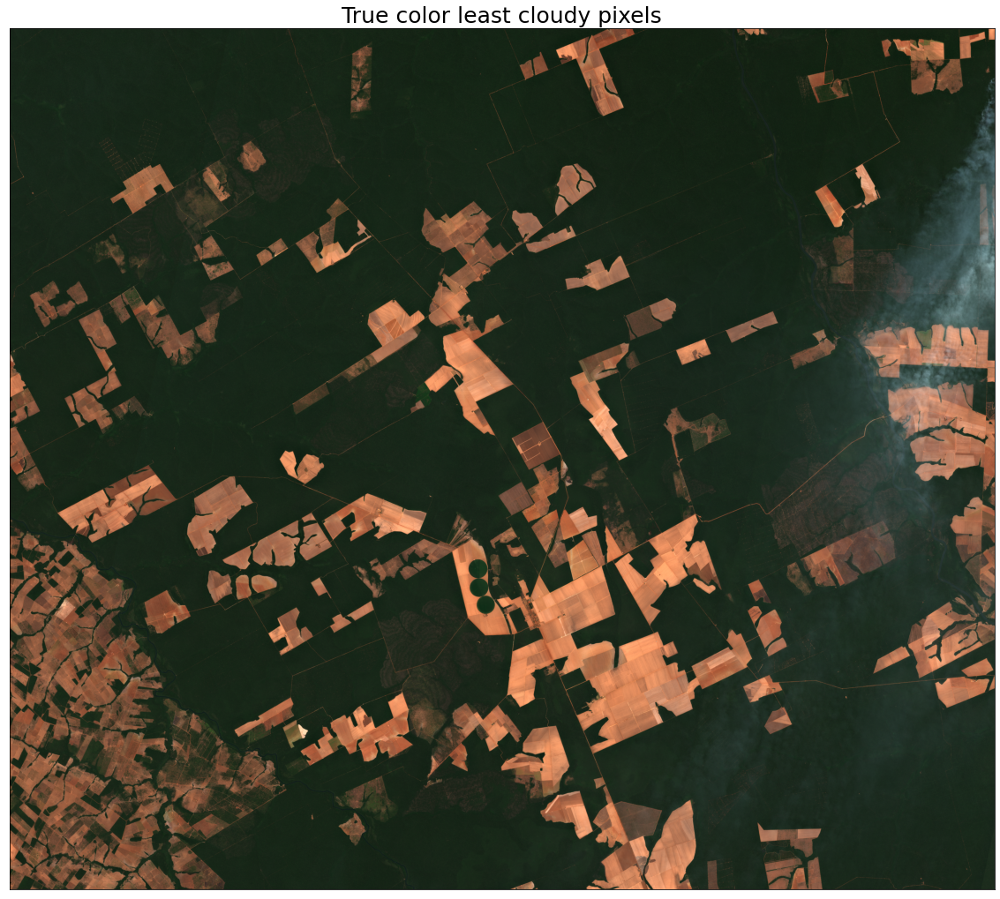

<AxesSubplot:title={'center':'True color least cloudy pixels'}>

In [54]:
fig_merged_tc, ax_merged_tc = plt.subplots(nrows=1, ncols=1, figsize=(20,20))
ax_merged_tc.set_xticks([])
ax_merged_tc.set_yticks([])
ax_merged_tc.set_title("True color least cloudy pixels", size=25)
show(merged_true_color_img)

In [55]:
merged_false_color_img = merge_img_arr(BUCKET_NAME, 3, x_size, y_size, false_color_list, "2_1")

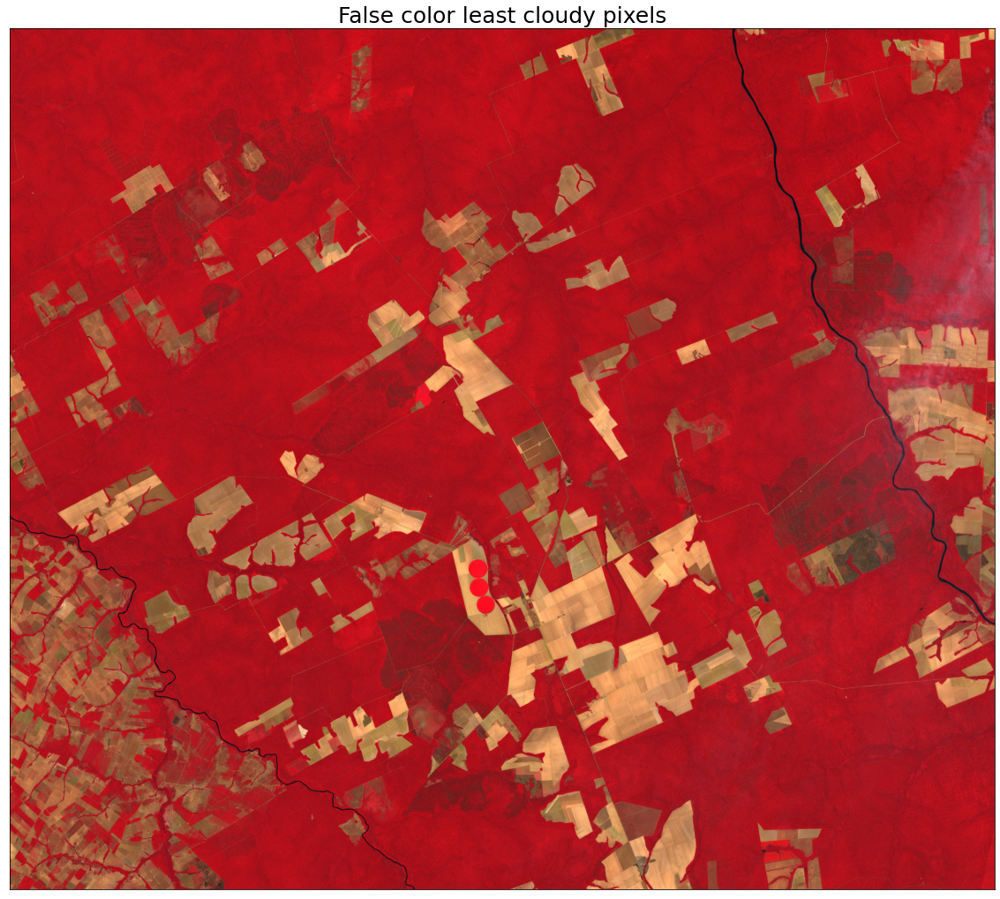

<AxesSubplot:title={'center':'False color least cloudy pixels'}>

In [56]:
fig_merged_fc, ax_merged_fc = plt.subplots(nrows=1, ncols=1, figsize=(20,20))
ax_merged_fc.set_xticks([])
ax_merged_fc.set_yticks([])
ax_merged_fc.set_title("False color least cloudy pixels", size=25)
show(merged_false_color_img)

## Batch Statistical API

The Batch statistical API enables you to request statistics similarly as with the Statistical API but for multiple polygons at once and/or for longer aggregations. A typical use case would be calculating statistics for all parcels in a country.

Similarly to the Batch processing API, this is an asynchronous REST service. This means that data will not be immediately returned in the response of the request but delivered to your object storage, which needs to be specified in the request. It is still in beta so does misbehave sometimes. 

- Request NDVI time series for other degraded areas

![other degraded areas](./media/other_degraded_area.png)